In [105]:
%load_ext autoreload
%autoreload 2

import pandas as pd
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


#### Let's solve the clustering problem for football players based on FIFA statistics that have been scrapped from the site sofifa.com. 
##### The dataset contains information about players: personal data and game statistics

In [106]:
url_link = 'https://query.data.world/s/ev6nxblbbfmhftigog5ffvexz4uzyf?dws=00000' # fifa stats
df = pd.read_csv(url_link, sep=',')
df.head(7)

,id,name,full_name,birth_date,age,height_cm,weight_kgs,positions,nationality,overall_rating,potential,value_euro,wage_euro,preferred_foot,international_reputation(1-5),weak_foot(1-5),skill_moves(1-5),work_rate,body_type,release_clause_euro,club_team,club_rating,club_position,club_jersey_number,club_join_date,contract_end_year,national_team,national_rating,national_team_position,national_jersey_number,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,freekick_accuracy,long_passing,ball_control,acceleration,sprint_speed,agility,reactions,balance,shot_power,jumping,stamina,strength,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle,GK_diving,GK_handling,GK_kicking,GK_positioning,GK_reflexes,tags,traits,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB
0,158023,L. Messi,Lionel Andrés Messi Cuccittini,1987-06-24,31,170.18,72.1,"CF,RW,ST",Argentina,94,94,110500000.0,565000.0,Left,5,4,4,Medium/ Low,Messi,226500000.0,FC Barcelona,86.0,RW,10.0,2004-07-01,2021,Argentina,82.0,RF,10.0,86,95,70,92,86,97,93,94,89,96,91,86,93,95,95,85,68,72,66,94,48,22,94,94,75,96,33,28,26,6,11,15,14,8,"#Dribbler,#Distance Shooter,#Crosser,#FK Speci...","Finesse Shot,Long Shot Taker (CPU AI Only),Spe...",89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,91+2,85+2,85+2,85+2,91+2,64+2,61+2,61+2,61+2,64+2,59+2,48+2,48+2,48+2,59+2
1,190460,C. Eriksen,Christian Dannemann Eriksen,1992-02-14,27,154.94,76.2,"CAM,RM,CM",Denmark,88,89,69500000.0,205000.0,Right,3,5,4,High/ Medium,Lean,133800000.0,Tottenham Hotspur,83.0,LCM,23.0,2013-08-30,2020,Denmark,78.0,CAM,10.0,88,81,52,91,80,84,86,87,89,91,76,73,80,88,81,84,50,92,58,89,46,56,84,91,67,88,59,57,22,9,14,7,7,6,"#Playmaker ,#Crosser,#FK Specialist,#Complete...","Flair,Long Shot Taker (CPU AI Only),Playmaker ...",79+3,79+3,79+3,85+3,84+3,84+3,84+3,85+3,86+3,86+3,86+3,86+3,85+3,85+3,85+3,86+3,71+3,71+3,71+3,71+3,71+3,66+3,57+3,57+3,57+3,66+3
2,195864,P. Pogba,Paul Pogba,1993-03-15,25,190.50,83.9,"CM,CAM",France,88,91,73000000.0,255000.0,Right,4,4,5,High/ Medium,Normal,144200000.0,Manchester United,82.0,LCM,6.0,2016-08-09,2021,France,84.0,RDM,6.0,80,75,75,86,85,87,85,82,90,90,71,79,76,82,66,90,83,88,87,82,78,64,82,88,82,87,63,67,67,5,6,2,4,3,"#Dribbler,#Playmaker ,#Strength,#Complete Mid...","Flair,Long Passer (CPU AI Only),Long Shot Take...",81+3,81+3,81+3,82+3,83+3,83+3,83+3,82+3,84+3,84+3,84+3,83+3,84+3,84+3,84+3,83+3,76+3,77+3,77+3,77+3,76+3,74+3,72+3,72+3,72+3,74+3
3,198219,L. Insigne,Lorenzo Insigne,1991-06-04,27,162.56,59.0,"LW,ST",Italy,88,88,62000000.0,165000.0,Right,3,4,4,High/ Medium,Normal,105400000.0,Napoli,82.0,LS,24.0,2010-07-01,2022,Italy,83.0,LW,10.0,86,77,56,85,74,90,87,77,78,93,94,86,94,83,93,75,53,75,44,84,34,26,83,87,61,83,51,24,22,8,4,14,9,10,"#Speedster,#Dribbler,#Crosser,#Acrobat","Finesse Shot,Long Shot Taker (CPU AI Only),Spe...",78+3,78+3,78+3,86+3,85+3,85+3,85+3,86+3,86+3,86+3,86+3,86+3,78+3,78+3,78+3,86+3,63+3,58+3,58+3,58+3,63+3,58+3,44+3,44+3,44+3,58+3
4,201024,K. Koulibaly,Kalidou Koulibaly,1991-06-20,27,187.96,88.9,CB,Senegal,88,91,60000000.0,135000.0,Right,3,3,2,High/ High,Normal,106500000.0,Napoli,82.0,LCB,26.0,2014-07-01,2021,NaN,NaN,NaN,NaN,30,22,83,68,14,69,28,28,60,63,70,75,50,82,40,55,81,75,94,15,87,88,24,49,33,80,91,88,87,7,11,7,13,5,"#Tackling ,#Tactician ,#Strength,#Complete Def...",Power Header,53+3,53+3,53+3,53+3,54+3,54+3,54+3,53+3,55+3,55+3,55+3,57+3,61+3,61+3,61+3,57+3,73+3,77+3,77+3,77+3,73+3,76+3,85+3,85+3,85+3,76+3
5,203376,V. van Dijk,Virgil van Dijk,1991-07-08,27,193.04,92.1,CB,Netherlands,88,90,59500000.0,215000.0,Right,3,3,2,Medium/ Medium,Normal,114500000.0,Liverpool,83.0,LCB,4.0,2018-01-01,2023,Netherlands,81.0,LCB,4.0,53,52,83,79,45,70,60,70,81,76,74,77,61,87,49,81,88,75,92,64,82,88,41,60,62,87,90,89,84,13,10,13,11,11,"#Tactician ,#Strength","Injury Free,Leadership,Power Header",68+3,68+3,68+3,66+3,67+3,67+3,67+3,66+3,68+3,68+3,68+3,68

In [107]:
pd.DataFrame(df.dtypes, columns=['type'])

,type
id,int64
name,object
full_name,object
birth_date,object
age,int64
height_cm,float64
weight_kgs,float64
positions,object
nationality,object
overall_rating,int64


#### Let's remove the `id`, `contract_end_year`, `club_jersey_number` columns, since it does not contain information for clustering, and also remove `birth_date` column, because we have an `age` column, it will be enough

In [108]:
df = df.drop(['id', 'birth_date', 'club_jersey_number', 'contract_end_year', 'club_join_date'], axis=1)
df.head(3)

,name,full_name,age,height_cm,weight_kgs,positions,nationality,overall_rating,potential,value_euro,wage_euro,preferred_foot,international_reputation(1-5),weak_foot(1-5),skill_moves(1-5),work_rate,body_type,release_clause_euro,club_team,club_rating,club_position,national_team,national_rating,national_team_position,national_jersey_number,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,freekick_accuracy,long_passing,ball_control,acceleration,sprint_speed,agility,reactions,balance,shot_power,jumping,stamina,strength,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle,GK_diving,GK_handling,GK_kicking,GK_positioning,GK_reflexes,tags,traits,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB
0,L. Messi,Lionel Andrés Messi Cuccittini,31,170.18,72.1,"CF,RW,ST",Argentina,94,94,110500000.0,565000.0,Left,5,4,4,Medium/ Low,Messi,226500000.0,FC Barcelona,86.0,RW,Argentina,82.0,RF,10.0,86,95,70,92,86,97,93,94,89,96,91,86,93,95,95,85,68,72,66,94,48,22,94,94,75,96,33,28,26,6,11,15,14,8,"#Dribbler,#Distance Shooter,#Crosser,#FK Speci...","Finesse Shot,Long Shot Taker (CPU AI Only),Spe...",89+2,89+2,89+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,93+2,91+2,85+2,85+2,85+2,91+2,64+2,61+2,61+2,61+2,64+2,59+2,48+2,48+2,48+2,59+2
1,C. Eriksen,Christian Dannemann Eriksen,27,154.94,76.2,"CAM,RM,CM",Denmark,88,89,69500000.0,205000.0,Right,3,5,4,High/ Medium,Lean,133800000.0,Tottenham Hotspur,83.0,LCM,Denmark,78.0,CAM,10.0,88,81,52,91,80,84,86,87,89,91,76,73,80,88,81,84,50,92,58,89,46,56,84,91,67,88,59,57,22,9,14,7,7,6,"#Playmaker ,#Crosser,#FK Specialist,#Complete...","Flair,Long Shot Taker (CPU AI Only),Playmaker ...",79+3,79+3,79+3,85+3,84+3,84+3,84+3,85+3,86+3,86+3,86+3,86+3,85+3,85+3,85+3,86+3,71+3,71+3,71+3,71+3,71+3,66+3,57+3,57+3,57+3,66+3
2,P. Pogba,Paul Pogba,25,190.50,83.9,"CM,CAM",France,88,91,73000000.0,255000.0,Right,4,4,5,High/ Medium,Normal,144200000.0,Manchester United,82.0,LCM,France,84.0,RDM,6.0,80,75,75,86,85,87,85,82,90,90,71,79,76,82,66,90,83,88,87,82,78,64,82,88,82,87,63,67,67,5,6,2,4,3,"#Dribbler,#Playmaker ,#Strength,#Complete Mid...","Flair,Long Passer (CPU AI Only),Long Shot Take...",81+3,81+3,81+3,82+3,83+3,83+3,83+3,82+3,84+3,84+3,84+3,83+3,84+3,84+3,84+3,83+3,76+3,77+3,77+3,77+3,76+3,74+3,72+3,72+3,72+3,74+3


#### I am going to analyze gaps in dataframe

In [109]:
def display_count_stats(df):
    df_count = pd.DataFrame(df.count(), columns=['cnt']).reset_index()
    with pd.option_context('display.max_colwidth', None):
      display(df_count.groupby('cnt').agg({'index': lambda val: ', '.join(val)}))
display_count_stats(df)

,index
cnt,
857,"national_team, national_rating, national_team_position, national_jersey_number"
1417,tags
8137,traits
15889,"LS, ST, RS, LW, LF, CF, RF, RW, LAM, CAM, RAM, LM, LCM, CM, RCM, RM, LWB, LDM, CDM, RDM, RWB, LB, LCB, CB, RCB, RB"
16117,release_clause_euro
17699,value_euro
17708,wage_euro
17940,"club_team, club_rating, club_position"
17954,"name, full_name, age, height_cm, weight_kgs, positions, nationality, overall_rating, potential, preferred_foot, international_reputation(1-5), weak_foot(1-5), skill_moves(1-5), work_rate, body_type, crossing, finishing, heading_accuracy, short_passing, volleys, dribbling, curve, freekick_accuracy, long_passing, ball_control, acceleration, sprint_speed, agility, reactions, balance, shot_power, jumping, stamina, strength, long_shots, aggression, interceptions, positioning, vision, penalties, composure, marking, standing_tackle, sliding_tackle, GK_diving, GK_handling, GK_kicking, GK_positioning, GK_reflexes"


In [110]:
df[['release_clause_euro', 'value_euro', 'wage_euro']].corr()

,release_clause_euro,value_euro,wage_euro
release_clause_euro,1.000000,0.994318,0.856239
value_euro,0.994318,1.000000,0.856466
wage_euro,0.856239,0.856466,1.000000


#### As we can see, there are often gaps in the `release_clause_euro`, `value_euro`, `wage_euro`, while there is a high correlation between them, so we will leave only one value

In [111]:
df = df.drop(['release_clause_euro', 'wage_euro'], axis=1)
display_count_stats(df)

,index
cnt,
857,"national_team, national_rating, national_team_position, national_jersey_number"
1417,tags
8137,traits
15889,"LS, ST, RS, LW, LF, CF, RF, RW, LAM, CAM, RAM, LM, LCM, CM, RCM, RM, LWB, LDM, CDM, RDM, RWB, LB, LCB, CB, RCB, RB"
17699,value_euro
17940,"club_team, club_rating, club_position"
17954,"name, full_name, age, height_cm, weight_kgs, positions, nationality, overall_rating, potential, preferred_foot, international_reputation(1-5), weak_foot(1-5), skill_moves(1-5), work_rate, body_type, crossing, finishing, heading_accuracy, short_passing, volleys, dribbling, curve, freekick_accuracy, long_passing, ball_control, acceleration, sprint_speed, agility, reactions, balance, shot_power, jumping, stamina, strength, long_shots, aggression, interceptions, positioning, vision, penalties, composure, marking, standing_tackle, sliding_tackle, GK_diving, GK_handling, GK_kicking, GK_positioning, GK_reflexes"


#### Also, there are often gaps in the national team stats. We will also remove these columns since the national team of the player is not so important to us for clustering

In [112]:
df = df.drop(['national_team', 'national_rating', 'national_team_position', 'national_jersey_number'], axis=1)

#### I plan to explore FIFA stats columns: LS, ST, RS... There is a rating "+" number in these columns. It indicates what boost/downgrade they get to their Overall rating due to level of morale & form for the position they are playing in. Let's analyze these values

In [113]:
stats_columns = 'LS, ST, RS, LW, LF, CF, RF, RW, LAM, CAM, RAM, LM, LCM, CM, RCM, RM, LWB, LDM, CDM, RDM, RWB, LB, LCB, CB, RCB, RB'.split(', ')

values = set()
for column in stats_columns:
    for value in df[column]:
        if pd.isna(value):
            continue
        values.add(value.split('+')[1])
values

{'2', '3', '4', '5'}

#### As we can see, these values are mostly small, so we can exclude them from the analysis

In [114]:
for column in stats_columns:
    df[column] = df[column].apply(
        lambda val: None if pd.isna(val) else int(val[:val.find('+')])
    )
df.head(3)

,name,full_name,age,height_cm,weight_kgs,positions,nationality,overall_rating,potential,value_euro,preferred_foot,international_reputation(1-5),weak_foot(1-5),skill_moves(1-5),work_rate,body_type,club_team,club_rating,club_position,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,freekick_accuracy,long_passing,ball_control,acceleration,sprint_speed,agility,reactions,balance,shot_power,jumping,stamina,strength,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle,GK_diving,GK_handling,GK_kicking,GK_positioning,GK_reflexes,tags,traits,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB
0,L. Messi,Lionel Andrés Messi Cuccittini,31,170.18,72.1,"CF,RW,ST",Argentina,94,94,110500000.0,Left,5,4,4,Medium/ Low,Messi,FC Barcelona,86.0,RW,86,95,70,92,86,97,93,94,89,96,91,86,93,95,95,85,68,72,66,94,48,22,94,94,75,96,33,28,26,6,11,15,14,8,"#Dribbler,#Distance Shooter,#Crosser,#FK Speci...","Finesse Shot,Long Shot Taker (CPU AI Only),Spe...",89.0,89.0,89.0,93.0,93.0,93.0,93.0,93.0,93.0,93.0,93.0,91.0,85.0,85.0,85.0,91.0,64.0,61.0,61.0,61.0,64.0,59.0,48.0,48.0,48.0,59.0
1,C. Eriksen,Christian Dannemann Eriksen,27,154.94,76.2,"CAM,RM,CM",Denmark,88,89,69500000.0,Right,3,5,4,High/ Medium,Lean,Tottenham Hotspur,83.0,LCM,88,81,52,91,80,84,86,87,89,91,76,73,80,88,81,84,50,92,58,89,46,56,84,91,67,88,59,57,22,9,14,7,7,6,"#Playmaker ,#Crosser,#FK Specialist,#Complete...","Flair,Long Shot Taker (CPU AI Only),Playmaker ...",79.0,79.0,79.0,85.0,84.0,84.0,84.0,85.0,86.0,86.0,86.0,86.0,85.0,85.0,85.0,86.0,71.0,71.0,71.0,71.0,71.0,66.0,57.0,57.0,57.0,66.0
2,P. Pogba,Paul Pogba,25,190.50,83.9,"CM,CAM",France,88,91,73000000.0,Right,4,4,5,High/ Medium,Normal,Manchester United,82.0,LCM,80,75,75,86,85,87,85,82,90,90,71,79,76,82,66,90,83,88,87,82,78,64,82,88,82,87,63,67,67,5,6,2,4,3,"#Dribbler,#Playmaker ,#Strength,#Complete Mid...","Flair,Long Passer (CPU AI Only),Long Shot Take...",81.0,81.0,81.0,82.0,83.0,83.0,83.0,82.0,84.0,84.0,84.0,83.0,84.0,84.0,84.0,83.0,76.0,77.0,77.0,77.0,76.0,74.0,72.0,72.0,72.0,74.0


#### Columns `positions`, `tags`, `traits` should naturally be converted using one-hot encoding

In [115]:
import re

oh_columns = set()

for column in ['positions', 'tags', 'traits']:
    df[column] = df[column].fillna('')

    values = set()
    for value in df[column]:
        if not value:
            continue
        values = values.union(value.split(','))

    for tag in values:
        df[f'is_{tag}'] = df[column].apply(
            lambda val: int(bool(re.search(re.escape(tag) + r'(,|$)', val)))
        )
        oh_columns.add(f'is_{tag}')

In [116]:
df.sample(5)

,name,full_name,age,height_cm,weight_kgs,positions,nationality,overall_rating,potential,value_euro,preferred_foot,international_reputation(1-5),weak_foot(1-5),skill_moves(1-5),work_rate,body_type,club_team,club_rating,club_position,crossing,finishing,heading_accuracy,short_passing,volleys,dribbling,curve,freekick_accuracy,long_passing,ball_control,acceleration,sprint_speed,agility,reactions,balance,shot_power,jumping,stamina,strength,long_shots,aggression,interceptions,positioning,vision,penalties,composure,marking,standing_tackle,sliding_tackle,GK_diving,GK_handling,GK_kicking,GK_positioning,GK_reflexes,tags,traits,LS,ST,RS,LW,LF,CF,RF,RW,LAM,CAM,RAM,LM,LCM,CM,RCM,RM,LWB,LDM,CDM,RDM,RWB,LB,LCB,CB,RCB,RB,is_LW,is_RWB,is_ST,is_LB,is_RB,is_CAM,is_RM,is_CB,is_RW,is_CF,is_CM,is_CDM,is_LM,is_LWB,is_GK,is_#Distance Shooter,is_#Tactician,is_#Aerial Threat,is_#Poacher,is_#Dribbler,is_#Clinical Finisher,is_#Speedster,is_#Engine,is_#Playmaker,is_#Complete Midfielder,is_#Crosser,is_#FK Specialist,is_#Complete Defender,is_#Complete Forward,is_#Strength,is_#Tackling,is_#Acrobat,is_Speed Dribbler (CPU AI Only),is_Finesse Shot,is_Injury Prone,is_Avoids Using Weaker Foot,is_GK Long Throw,is_Technical Dribbler (CPU AI Only),is_Long Passer (CPU AI Only),is_Target Forward,is_Dives Into Tackles (CPU AI Only),is_Takes Finesse Free Kicks,is_Giant Throw-in,is_Flair,is_Through Ball,is_Chip Shot (CPU AI Only),is_Comes For Crosses,is_Beat Offside Trap,is_Long Throw-in,is_Power Free-Kick,is_1-on-1 Rush,is_Power Header,is_Diver,is_Puncher,is_Selfish,is_Long Shot Taker (CPU AI Only),is_Early Crosser,is_Outside Foot Shot,is_Rushes Out Of Goal,is_One Club Player,is_Leadership,is_Team Player,is_Injury Free,is_Cautious With Crosses,is_Playmaker (CPU AI Only),is_Saves with Feet,is_Backs Into Player,is_Set Play Specialist,is_GK Up for Corners
15392,E. Insúa,Emanuel Insúa,27,182.88,81.2,"LB,LWB",Argentina,72,73,2900000.0,Left,1,3,3,High/ Medium,Normal,Panathinaikos FC,71.0,LB,64,55,67,68,30,66,33,42,65,67,71,75,67,70,65,72,76,83,70,63,82,68,63,60,41,65,69,71,72,8,11,7,14,8,,Avoids Using Weaker Foot,64.0,64.0,64.0,65.0,65.0,65.0,65.0,65.0,65.0,65.0,65.0,66.0,66.0,66.0,66.0,66.0,70.0,69.0,69.0,69.0,70.0,70.0,70.0,70.0,70.0,70.0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
15824,J. Lolley,Joe Lolley,26,152.40,72.1,"RM,LM",England,73,74,4800000.0,Left,1,3,3,High/ Medium,Lean,Nottingham Forest,72.0,RM,70,64,47,66,63,79,63,51,62,73,86,82,91,70,73,68,57,81,41,74,55,45,64,70,67,62,51,53,41,15,16,10,9,14,#Acrobat,"Avoids Using Weaker Foot,Long Shot Taker (CPU ...",66.0,66.0,66.0,72.0,70.0,70.0,70.0,72.0,71.0,71.0,71.0,72.0,67.0,67.0,67.0,72.0,63.0,58.0,58.0,58.0,63.0,61.0,51.0,51.0,51.0,61.0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
8309,O. Rodas,Óscar Eduardo Rodas Vargas,31,175.26,74.8,ST,Colombia,62,62,270000.0,Right,1,3,2,Medium/ Low,Stocky,Boyacá Chicó FC,62.0,ST,22,62,47,52,49,61,33,29,43,60,72,75,74,60,73,68,70,63,61,56,50,16,64,50,52,56,22,17,19,14,11,6,10,15,,,60.0,60.0,60.0,57.0,60.0,60.0,60.0,57.0,58.0,58.0,58.0,56.0,51.0,51.0,51.0,56.0,40.0,39.0,39.0,39.0,40.0,38.0,35.0,35.0,35.0,38.0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8648,M. Stoll,Martin Stoll,36,187.96,79.8,CB,Germany,63,63,90000.0,Right,1,4,2,Medium/ Medium,Normal,Karlsruher SC,66.0,RES,32,40,64,51,31,39,23,34,49,55,37,31,50,65,53,44,51,31,75,43,60,62,37,42,29,67,65,63,61,16,15,12,8,10,,Team Player,47.0,47.0,47.0,43.0,45.0,45.0,45.0,43.0,46.0,46.0,46.0,43.0,48.0,48.0,48.0,43.0,50.0,56.0,56.0,56.0,50.0,52.0,62.0,62.0,62.0,52.0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0
16775,G. Haraguchi,原口 元気,27,152.40,68.0,"LM,RM",Japan,75,7

In [117]:
df = df.drop(['positions', 'tags', 'traits'], axis=1)

In [118]:
display_count_stats(df)

,index
cnt,
15889,"LS, ST, RS, LW, LF, CF, RF, RW, LAM, CAM, RAM, LM, LCM, CM, RCM, RM, LWB, LDM, CDM, RDM, RWB, LB, LCB, CB, RCB, RB"
17699,value_euro
17940,"club_team, club_rating, club_position"
17954,"name, full_name, age, height_cm, weight_kgs, nationality, overall_rating, potential, preferred_foot, international_reputation(1-5), weak_foot(1-5), skill_moves(1-5), work_rate, body_type, crossing, finishing, heading_accuracy, short_passing, volleys, dribbling, curve, freekick_accuracy, long_passing, ball_control, acceleration, sprint_speed, agility, reactions, balance, shot_power, jumping, stamina, strength, long_shots, aggression, interceptions, positioning, vision, penalties, composure, marking, standing_tackle, sliding_tackle, GK_diving, GK_handling, GK_kicking, GK_positioning, GK_reflexes, is_LW, is_RWB, is_ST, is_LB, is_RB, is_CAM, is_RM, is_CB, is_RW, is_CF, is_CM, is_CDM, is_LM, is_LWB, is_GK, is_#Distance Shooter, is_#Tactician , is_#Aerial Threat, is_#Poacher, is_#Dribbler, is_#Clinical Finisher, is_#Speedster, is_#Engine, is_#Playmaker , is_#Complete Midfielder, is_#Crosser, is_#FK Specialist, is_#Complete Defender, is_#Complete Forward, is_#Strength, is_#Tackling , is_#Acrobat, is_Speed Dribbler (CPU AI Only), is_Finesse Shot, is_Injury Prone, is_Avoids Using Weaker Foot, is_GK Long Throw, is_Technical Dribbler (CPU AI Only), is_Long Passer (CPU AI Only), is_Target Forward, is_Dives Into Tackles (CPU AI Only), is_Takes Finesse Free Kicks, is_Giant Throw-in, is_Flair, is_Through Ball, is_Chip Shot (CPU AI Only), is_Comes For Crosses, is_Beat Offside Trap, is_Long Throw-in, is_Power Free-Kick, is_1-on-1 Rush, is_Power Header, is_Diver, is_Puncher, is_Selfish, is_Long Shot Taker (CPU AI Only), is_Early Crosser, is_Outside Foot Shot, is_Rushes Out Of Goal, is_One Club Player, is_Leadership, is_Team Player, is_Injury Free, is_Cautious With Crosses, is_Playmaker (CPU AI Only), is_Saves with Feet, is_Backs Into Player, is_Set Play Specialist, is_GK Up for Corners"


#### Player statistics are very important to us, since we use them to perform clustering, we will remove all players with gaps in statistics

In [119]:
df = df[~pd.isna(df['LS'])]

In [120]:
display_count_stats(df)

,index
cnt,
15675,value_euro
15876,"club_team, club_rating, club_position"
15889,"name, full_name, age, height_cm, weight_kgs, nationality, overall_rating, potential, preferred_foot, international_reputation(1-5), weak_foot(1-5), skill_moves(1-5), work_rate, body_type, crossing, finishing, heading_accuracy, short_passing, volleys, dribbling, curve, freekick_accuracy, long_passing, ball_control, acceleration, sprint_speed, agility, reactions, balance, shot_power, jumping, stamina, strength, long_shots, aggression, interceptions, positioning, vision, penalties, composure, marking, standing_tackle, sliding_tackle, GK_diving, GK_handling, GK_kicking, GK_positioning, GK_reflexes, LS, ST, RS, LW, LF, CF, RF, RW, LAM, CAM, RAM, LM, LCM, CM, RCM, RM, LWB, LDM, CDM, RDM, RWB, LB, LCB, CB, RCB, RB, is_LW, is_RWB, is_ST, is_LB, is_RB, is_CAM, is_RM, is_CB, is_RW, is_CF, is_CM, is_CDM, is_LM, is_LWB, is_GK, is_#Distance Shooter, is_#Tactician , is_#Aerial Threat, is_#Poacher, is_#Dribbler, is_#Clinical Finisher, is_#Speedster, is_#Engine, is_#Playmaker , is_#Complete Midfielder, is_#Crosser, is_#FK Specialist, is_#Complete Defender, is_#Complete Forward, is_#Strength, is_#Tackling , is_#Acrobat, is_Speed Dribbler (CPU AI Only), is_Finesse Shot, is_Injury Prone, is_Avoids Using Weaker Foot, is_GK Long Throw, is_Technical Dribbler (CPU AI Only), is_Long Passer (CPU AI Only), is_Target Forward, is_Dives Into Tackles (CPU AI Only), is_Takes Finesse Free Kicks, is_Giant Throw-in, is_Flair, is_Through Ball, is_Chip Shot (CPU AI Only), is_Comes For Crosses, is_Beat Offside Trap, is_Long Throw-in, is_Power Free-Kick, is_1-on-1 Rush, is_Power Header, is_Diver, is_Puncher, is_Selfish, is_Long Shot Taker (CPU AI Only), is_Early Crosser, is_Outside Foot Shot, is_Rushes Out Of Goal, is_One Club Player, is_Leadership, is_Team Player, is_Injury Free, is_Cautious With Crosses, is_Playmaker (CPU AI Only), is_Saves with Feet, is_Backs Into Player, is_Set Play Specialist, is_GK Up for Corners"


#### After preprocessing, there are few lines with gaps left, it would be rational to just remove them

In [121]:
df = df.dropna()
display_count_stats(df)

,index
cnt,
15675,"name, full_name, age, height_cm, weight_kgs, nationality, overall_rating, potential, value_euro, preferred_foot, international_reputation(1-5), weak_foot(1-5), skill_moves(1-5), work_rate, body_type, club_team, club_rating, club_position, crossing, finishing, heading_accuracy, short_passing, volleys, dribbling, curve, freekick_accuracy, long_passing, ball_control, acceleration, sprint_speed, agility, reactions, balance, shot_power, jumping, stamina, strength, long_shots, aggression, interceptions, positioning, vision, penalties, composure, marking, standing_tackle, sliding_tackle, GK_diving, GK_handling, GK_kicking, GK_positioning, GK_reflexes, LS, ST, RS, LW, LF, CF, RF, RW, LAM, CAM, RAM, LM, LCM, CM, RCM, RM, LWB, LDM, CDM, RDM, RWB, LB, LCB, CB, RCB, RB, is_LW, is_RWB, is_ST, is_LB, is_RB, is_CAM, is_RM, is_CB, is_RW, is_CF, is_CM, is_CDM, is_LM, is_LWB, is_GK, is_#Distance Shooter, is_#Tactician , is_#Aerial Threat, is_#Poacher, is_#Dribbler, is_#Clinical Finisher, is_#Speedster, is_#Engine, is_#Playmaker , is_#Complete Midfielder, is_#Crosser, is_#FK Specialist, is_#Complete Defender, is_#Complete Forward, is_#Strength, is_#Tackling , is_#Acrobat, is_Speed Dribbler (CPU AI Only), is_Finesse Shot, is_Injury Prone, is_Avoids Using Weaker Foot, is_GK Long Throw, is_Technical Dribbler (CPU AI Only), is_Long Passer (CPU AI Only), is_Target Forward, is_Dives Into Tackles (CPU AI Only), is_Takes Finesse Free Kicks, is_Giant Throw-in, is_Flair, is_Through Ball, is_Chip Shot (CPU AI Only), is_Comes For Crosses, is_Beat Offside Trap, is_Long Throw-in, is_Power Free-Kick, is_1-on-1 Rush, is_Power Header, is_Diver, is_Puncher, is_Selfish, is_Long Shot Taker (CPU AI Only), is_Early Crosser, is_Outside Foot Shot, is_Rushes Out Of Goal, is_One Club Player, is_Leadership, is_Team Player, is_Injury Free, is_Cautious With Crosses, is_Playmaker (CPU AI Only), is_Saves with Feet, is_Backs Into Player, is_Set Play Specialist, is_GK Up for Corners"


In [122]:
types = pd.DataFrame(df.dtypes, columns=['type'])
types[types['type'] == 'object']

,type
name,object
full_name,object
nationality,object
preferred_foot,object
work_rate,object
body_type,object
club_team,object
club_position,object


#### From the string columns we will remove the columns of information about the club, since it is either redundant: the player’s positions are already known, or it does not give anything: the name of the club. We will also remove information about nationality. The remaining columns will be encoded using one-hot encoding

In [123]:
df = pd.get_dummies(df, columns=['preferred_foot', 'work_rate', 'body_type'], drop_first=True)
df = df.drop(['nationality', 'club_team', 'club_position'], axis=1)

In [125]:
pd.DataFrame(df.dtypes, columns=['type'])

,type
name,object
full_name,object
age,int64
height_cm,float64
weight_kgs,float64
overall_rating,int64
potential,int64
value_euro,float64
international_reputation(1-5),int64
weak_foot(1-5),int64


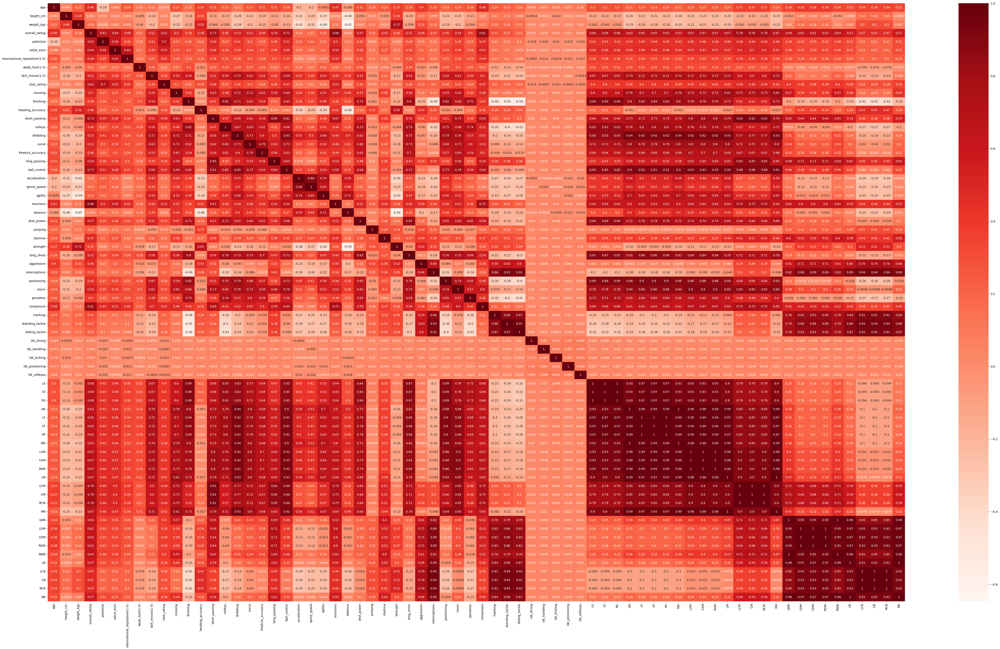

In [133]:
import seaborn as sns
import matplotlib.pyplot as plt

def display_corr_matrix(df):
    plt.figure(figsize=(64, 36))
    index = list(df.columns).index('is_LW')
    corr = df[df.columns[:index]].corr()
    sns.heatmap(corr, cmap='Reds', annot=True)

display_corr_matrix(df)

#### First, let’s exclude strictly linearly dependent features

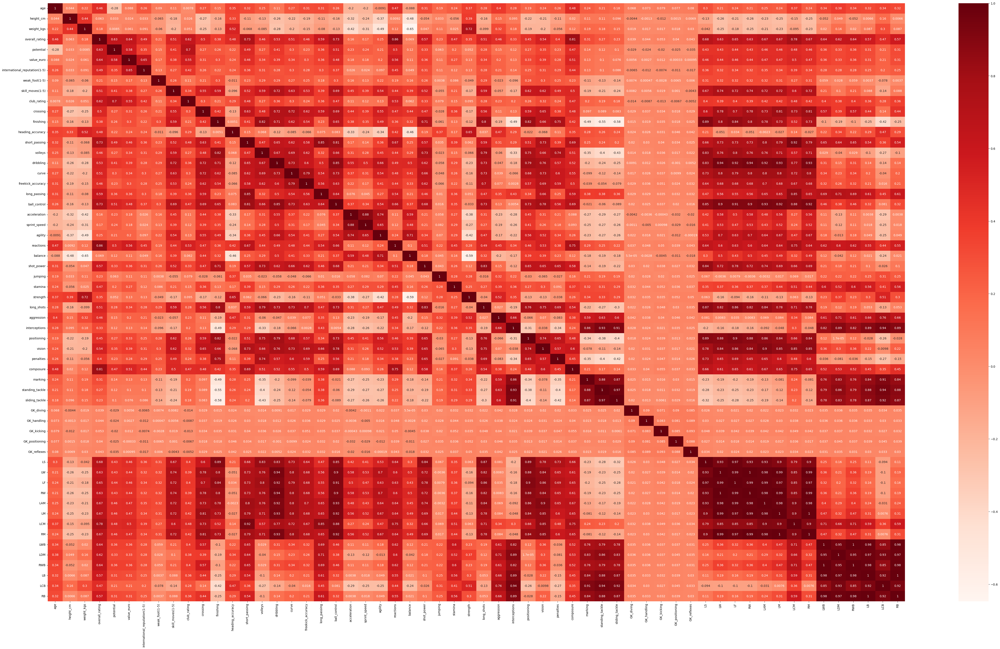

In [134]:
df = df.drop(['ST', 'RS', 'CF', 'RF', 'CAM', 'RAM', 'CM', 'RCM', 'CDM', 'RDM', 'CB', 'RCB'], axis=1)
display_corr_matrix(df)

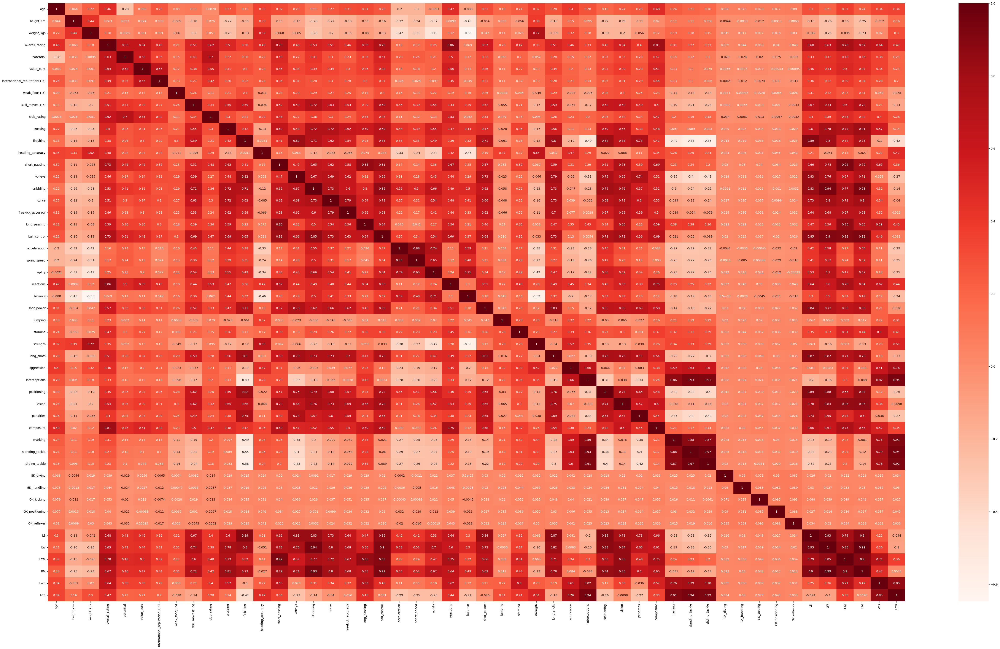

In [135]:
df = df.drop(['LF', 'RW', 'LAM', 'LM', 'LDM', 'RWB', 'LB', 'RB'], axis=1)
display_corr_matrix(df)

#### Then we will eliminate multicollinearity with correlation coefficients of at least 0.93

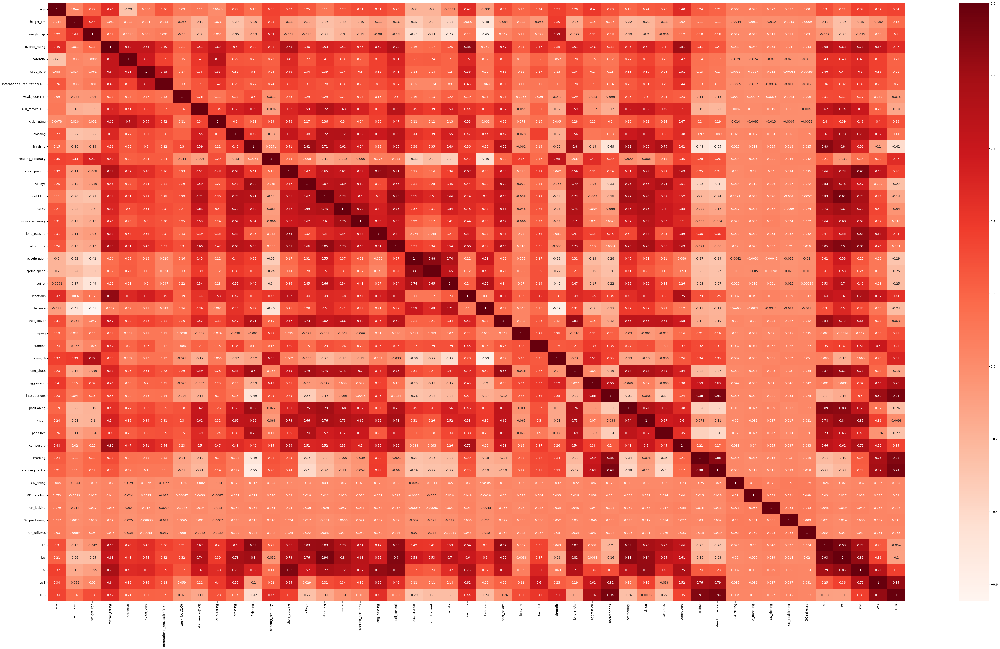

In [136]:
df = df.drop(['RM', 'sliding_tackle'], axis=1)
display_corr_matrix(df)

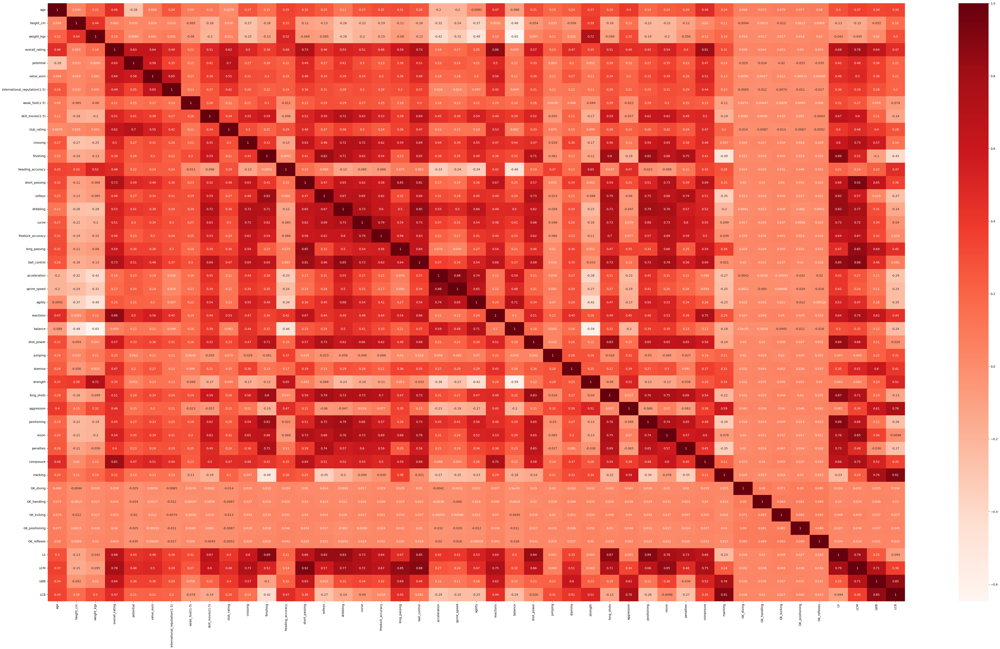

In [137]:
df = df.drop(['LW', 'interceptions', 'standing_tackle'], axis=1)
display_corr_matrix(df)

In [138]:
df.shape

(15675, 133)